<img src='http://drive.google.com/uc?export=view&id=1UAsSD6z0wK4UJjjzBhDEIlSZnELLmeeb'>

# <font color='lightblue'>Answering Questions</font>

In this project you will use all you learnt about in the class to answer a question. Imagine you are part of a team and you have been assigned a question to answer, build a notebook that you would be able to share with your team that shows what you found. 

In this project you will:

1.  Introduce your question of interest
2.  Make sure your reader knows enough about the data
3.  Wrangle and preprocess your data so that a team mate can reproduce your work
4.  Build and test a model that can provide insight into your question
5.  Interpret your model results
6.  Answer your question



Note: Marks will be awarded for clarity, organization, and succinctness. I.e., try to point out only the important parts in a well-organized easy to follow manner. (Marks: 3)

## <font color='lightblue'>1. Ask a question </font>

**Q1**: Layout your question of interest. Remember to state your question as clearly and simply as you can (Mark 1), and what your ideal outcome would be (Marks 1).

**Q2**: Identify and describe what data sources you'll use (Marks 1). Make sure to talk about one of the following: data accuracy, reliability, validity, or sample selection. (Marks: 1)

**Q3**: Layout what kind of ML problem you are facing and what kind of model you'll use to answer it (eg., is it unsupervised or supervised learning, and is it classification or regression). Make sure to say why. (Marks 1)

<font color='orange'>** Q1: How does Canadian Internet usage relate to age?

<font color='orange'> I want to see if a model can predict how old someone is based on their internet activities. If someone is making income on the internet, they are likely older whereas if they use a lot of smart devices or play video games they are likely younger. The oldest age groups likely do not use the internet much at all.

Unfortunately, due to the nature of the data and time limits, it was a lot easier to complete the opposite question (based on someone's age, how likely are they to use a given application/engage in a given activity on a smartphone). However, I believe I was able to correctly run the decision tree on this sole multiple-choice question. This data set is very comprehensive, and would benefit from a longer time working with the data in order to come up with a better model.


<font color='lime'> ** Q2:  My primary data set will be the Canadian Internet Usage Survey from 2018.

Data accuracy: The data comes from a government-sponsored survey, which means that survey responses could introduce bias if people are not fully honest or are only estimating/don't know their actual internet usage habits. Given that a division of the government worked to gather the data, there is little error in the process they used. The methods used are detailed on their website: (https://www23.statcan.gc.ca/imdb/p2SV.pl?Function=getSurvey&Id=1196799).

Reliability: Given that the people taking the survey are all answering the same questions, and the questions were created by a government institution, the survey should be pretty reliable. The only bias introduced is human error and opinion, which is hard to measure. If people were not fully honest or estimated their usage, this would cause the survey and data to be less reliable.

Validity: The survey asks over 100 specific questions about internet usage to thousands of respondents, ensuring pretty good validity for the entire survey. The questions are mostly objective, asking whether or not a person used a given service or device (or completed a certain internet-based action) within the past 3 months. It also asks for estimates on time used or, if they did not use it, they provide multiple choice answers suggesting why they may not have used that service/device/action.

Sample Selection: This survey had a cross-sectional design, using landlines and cellular phones from the census to determine a stratified selection of respondents at the provincial level. A phone survey was initially offered to 33,000 people, with each being from one randomly selected household member aged 15 or older. From there, they sent out 15,000 questionairres to willing respondents. Each respondent has a weighted value that represents a share of the entire Canadian population. For my purposes, this data is excellent due to haveing thousands of respondents.

<font color='cyan'> ** Q3: The ML problem will be training a set given various internet usages, predict the age of the person. I will be running a supervised model using a decision tree with classification as I am working with discrete data points (age). This will be best since decision trees can run classification models while still retaining explainability. If I have time, since the data set is large I might run a random forest, with a bunch of decision trees in order to better predict the data. However, I may lose some explainability due to the many different variables and high variability.

</font>

## <font color='lightblue'>2. Data understanding, exploration, and visualization </font>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


##Install relevant files:

In [ ]:
# Make sure to run this install first/near the beginning because you must restart the runtime! 
# It helps to do this at the same time as loading in your data set.

In [ ]:
pip install --upgrade pandas --user

     |████████████████████████████████| 11.3 MB 5.3 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas~=1.1.0; python_version >= "3.0", but you have pandas 1.3.2 which is incompatible.


In [ ]:
pip install pyreadstat

     |████████████████████████████████| 2.5 MB 5.2 MB/s 


In [ ]:
!pip install dtreeviz
from dtreeviz.trees import dtreeviz 

     |████████████████████████████████| 60 kB 3.4 MB/s 
  Created wheel for dtreeviz: filename=dtreeviz-1.3-py3-none-any.whl size=66637 sha256=b0ef3cf7941add300a24317f8ac4a8117fbe963afbc94cc952ef11a1dc212629
  Stored in directory: /root/.cache/pip/wheels/9f/a6/a1/898c991294471015f13c1e5b456fb8134c1af835db4dd93a7a
Successfully built dtreeviz


In [ ]:
#Import Python libraries

import sklearn as sk
import pandas as pd
import seaborn as sns
import numpy as np

import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
import statsmodels.api as sm #for running regression!
import statsmodels.formula.api as smf


/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
#Read in the data
df_tech = pd.read_spss('/content/cius_2018_en.sav')

#### <font color='lightblue'> 3. Data wrangling and Preprocessing Pt1: (Setting Age variable to an integer)

In [ ]:
#Check for data types that are not float
df_tech.select_dtypes(exclude=['float64']).dtypes

AGE_GRP    object
dtype: object

In [ ]:
#Set the age group column to numeric
df_tech = df_tech.apply(lambda AGE_GRP:pd.to_numeric(AGE_GRP, errors='coerce'))

**Action**: While above you gave an overview of the dataset(s) that will be used, here make sure that the reader understands the important details of the data. E.g., show a figure or descriptive statistic and explain why the reader should know about this, i.e., how will it help your reader understand your analysis? (Marks: 2)

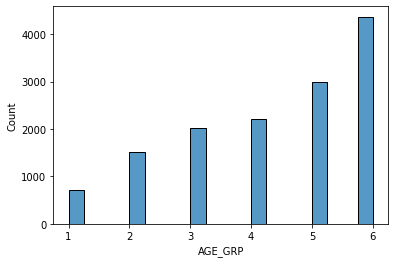

In [ ]:
plot1 = sns.histplot(df_tech, x="AGE_GRP")

In [ ]:
len(df_tech)

13810

<font color='orange'> **Clearly, this survey seems somewhat biased to older people; over 4000 people in the 65 years and older group took the survey, while only around 700 people aged 15-24 took the survey. This means that the data set may be skewed slightly towards older Canadians, possibly simply because they are more available for survey taking (as well, you cannot ethically survey people under 18 years old easily).

In [ ]:
#count how many of each value in a column using value_conunts
df_tech.AGE_GRP.value_counts()

6    4363
5    2986
4    2217
3    2017
2    1521
1     706
Name: AGE_GRP, dtype: int64

<font color='orange'> **We can get the mean, median and mode of the age groups to further analyze them:

In [ ]:
mean_age_group = df_tech.AGE_GRP.mean()
mode_age = df_tech.AGE_GRP.mode()

print('The mean age group is = ',mean_age_group) 
print('The most frequent age group is ',mode_age)
print('Given the coding, mean is ', end = '')
if 2.0 > mean_age_group > 1.0:
  print ('15 to 24 years')
elif 3.0 > mean_age_group > 2.0:
  print ('25 to 34 years')
elif 4.0 > mean_age_group > 3.0:
  print ('35 to 44 years')
elif 5.0 > mean_age_group > 4.0:
  print ('45 to 54 years')
elif 6.0 > mean_age_group > 5.0:
  print ('55 to 64 years')
elif mean_age_group > 6.0:
  print ('65 years and over')

print('Given the coding, mode is ', end = '')
if 2 > mode_age[0] > 1:
  print ('15 to 24 years')
elif 3 > mode_age[0] > 2:
  print ('25 to 34 years')
elif 4 > mode_age[0] > 3:
  print ('35 to 44 years')
elif 5 > mode_age[0] > 4:
  print ('45 to 54 years')
elif 6 > mode_age[0] > 5:
  print ('55 to 64 years')
else:
  print ('65 years and over')  

The mean age group is =  4.328385228095583
The most frequent age group is  0    6
dtype: int64
Given the coding, mean is 45 to 54 years
Given the coding, mode is 65 years and over


<font color='aqua'>**Next, I can run a correlation based on age and question AC_160A, which asks whether someone has used the internet in the past 3 months for personal use.

In [ ]:
age_column = df_tech["AGE_GRP"]
question_one = df_tech["AC_160A"]

first_correlation = age_column.corr(question_one)
print(first_correlation)

0.30209922035717207


<font color='orange'>This correlation coefficient (0.30) is a weak, slighlty positive correlation. An overlying relationship between age group and whether or not someone has used the internet in the last 3 months barely exists. 

<font color='aqua'>**I would run a correlation and display a heat map of all of the data, but there are too many columns to make sense of it. However, it doesn't make sense to remove the data because that loses validity and has the potential to decrease accuracy when running a ML model.

#### <font color='lightblue'>3. Data wrangling and preprocessing Pt2: </font>



**Action**: Layout all your data wrangling and preprocessing steps so that a reader will understand why you took each step, and would be able to reproduce your steps. (Marks: 3)

<font color='orange'>In order to prepare the model, I will split the age group sets into 6 groups and ideally run models on each of them using all of the questions in the SM300 group of questions (which consider activities performed on the internet using a smartphone). To start, I'll only run a model on the mean age group, 45-54yr olds or group 4.

In [ ]:
#convert Age to category
df_tech['AGE_GRP'] = df_tech.AGE_GRP.astype('category')

#categorical variables
cat_names = ['AGE_GRP']

#create dummy variables
df_cat = pd.get_dummies(df_tech[cat_names])

#add them back to the original dataframe
df_tech = pd.concat([df_tech,df_cat], axis=1)

# Normally, remove the old columns using:
# df_tech = df_tech.drop(cat_names, axis=1)
# But I need that column later for the decision tree.

#take a look
df_tech.head(3)

,PUMFID,PROVINCE,LUC_RST,ABOSTAT,G_EDUC,HSDSIZEC,GENDER,AGE_GRP,HCOMP,LAN_Q01,EMP,DGI_Q05,BPR_Q16,AC_160A,AC_170A,AC_170B,AC_170C,AC_170E,AC_170F,AC_170G,AC_170H,AC_180A,AC_190A,AC_190B,AC_190C,AC_190D,AC_G190F,AC_G190I,AC_190J,AC_190K,AC_190L,AC_200A,AC_200B,AC_200C,AC_200D,AC_200E,AC_200F,AC_200G,AC_200H,UI_210A,...,WRPM967,WRPM968,WRPM969,WRPM970,WRPM971,WRPM972,WRPM973,WRPM974,WRPM975,WRPM976,WRPM977,WRPM978,WRPM979,WRPM980,WRPM981,WRPM982,WRPM983,WRPM984,WRPM985,WRPM986,WRPM987,WRPM988,WRPM989,WRPM990,WRPM991,WRPM992,WRPM993,WRPM994,WRPM995,WRPM996,WRPM997,WRPM998,WRPM999,WRPM1000,AGE_GRP_1,AGE_GRP_2,AGE_GRP_3,AGE_GRP_4,AGE_GRP_5,AGE_GRP_6
0,100000.0,48.0,1.0,3.0,2.0,1.0,2.0,3,3.0,1.0,1.0,3.0,2.0,1.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,1.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,3.0,3.0,3.0,3.0,1.0,1.0,1.0,3.0,4.0,...,0.0,2808.92815,0.00000,0.00000,0.00000,0.00000,2457.45374,0.00000,2235.92299,0.0,2217.71084,2206.77439,0.00000,4830.79859,6431.03620,0.0,0.00000,2266.55762,2156.35778,7149.30447,3415.20912,2873.47439,0.00000,2181.94038,0.00000,2278.03569,6043.52574,0.00000,2267.01329,2136.04619,2213.52209,5869.57769,2365.75576,0.0,0,0,1,0,0,0
1,100001.0,47.0,2.0,3.0,1.0,1.0,1.0,5,3.0,1.0,1.0,3.0,2.0,3.0,3.0,3.0,1.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,1.0,1.0,3.0,3.0,3.0,3.0,3.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,...,0.0,546.36573,1496.13965,1930.70973,613.04946,0.00000,502.71999,615.25353,1105.91170,0.0,1961.58494,0.00000,1975.60766,588.58199,0.00000,0.0,0.00000,0.00000,587.36955,0.00000,0.00000,1352.36455,676.40579,893.75469,0.00000,449.22781,594.72037,871.92424,0.00000,1014.09571,519.42379,1138.34998,0.00000,0.0,0,0,0,0,1,0
2,100002.0,24.0,1.0,3.0,3.0,1.0,1.0,5,3.0,3.0,1.0,3.0,2.0,1.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,1.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,1.0,3.0,3.0,1.0,3.0,1.0,3.0,3.0,2.0,...,0.0,0.00000,3485.37170,0.00000,0.00000,1362.72722,1367.92980,2503.97189,2618.80421,0.0,0.00000,0.00000,1230.27881,1294.42957,1397.63883,0.0,1430.16845,2637.27013,1304.13891,2505.71047,1325.76979,0.00000,2693.93332,2868.91185,3378.79949,0.00000,0.00000,3824.49238,0.00000,1561.69225,1340.06611,2433.46893,0.00000,0.0,0,0,0,0,1,0


<font color='orange'>I split the data into training and testing data sets in order to run the logisitic regression.

In [ ]:
#split the data into training and testing (80/20 split)
df_train, df_test = sk.model_selection.train_test_split(df_tech, test_size=0.20)

<font color='orange'>I ran the logistic regression with the mean age group (AGE_GRP_4/45-54 year olds) as the main independent variable and each of the multiple choice questions as the varying parameters.

In [ ]:
#define model parameters
log_reg_sur = smf.logit('AGE_GRP_4 ~ SM_300A + SM_300B + SM_300C + SM_300D + SM_300E + SM_300F + SM_300G + SM_300H + SM_300I + SM_300J + SM_300K', data=df_train)

#fit the model to the training data
results_sur = log_reg_sur.fit()

#Get a summary of the model parameters
print(results_sur.summary())

Optimization terminated successfully.
         Current function value: 0.431820
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:              AGE_GRP_4   No. Observations:                11048
Model:                          Logit   Df Residuals:                    11036
Method:                           MLE   Df Model:                           11
Date:                Sat, 21 Aug 2021   Pseudo R-squ.:                 0.01997
Time:                        07:16:17   Log-Likelihood:                -4770.7
converged:                       True   LL-Null:                       -4867.9
Covariance Type:            nonrobust   LLR p-value:                 1.088e-35
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -1.1518      0.085    -13.488      0.000      -1.319      -0.984
SM_300A       -0.1330      0.

<font color='orange'>####**I also ran it on age group 1 (15-24 year olds):

In [ ]:
#define model parameters
log_reg_sur_one = smf.logit('AGE_GRP_1 ~ SM_300A + SM_300B + SM_300C + SM_300D + SM_300E + SM_300F + SM_300G + SM_300H + SM_300I + SM_300J + SM_300K', data=df_train)

#fit the model to the training data
results_sur_one = log_reg_sur_one.fit()

#Get a summary of the model parameters
print(results_sur_one.summary())

Optimization terminated successfully.
         Current function value: 0.171328
         Iterations 8
                           Logit Regression Results                           
Dep. Variable:              AGE_GRP_1   No. Observations:                11048
Model:                          Logit   Df Residuals:                    11036
Method:                           MLE   Df Model:                           11
Date:                Sat, 21 Aug 2021   Pseudo R-squ.:                  0.1546
Time:                        06:01:29   Log-Likelihood:                -1892.8
converged:                       True   LL-Null:                       -2238.9
Covariance Type:            nonrobust   LLR p-value:                2.613e-141
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -2.1081      0.162    -12.999      0.000      -2.426      -1.790
SM_300A        0.1631      0.

<font color='orange'> ####**Finally, I ran it on age group 6 (oldest/65 yr +):

In [ ]:
#define model parameters
log_reg_sur_six = smf.logit('AGE_GRP_6 ~ SM_300A + SM_300B + SM_300C + SM_300D + SM_300E + SM_300F + SM_300G + SM_300H + SM_300I + SM_300J + SM_300K', data=df_train)

#fit the model to the training data
results_sur_six = log_reg_sur_six.fit()

#Get a summary of the model parameters
print(results_sur_six.summary())

Optimization terminated successfully.
         Current function value: 0.498217
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:              AGE_GRP_6   No. Observations:                11048
Model:                          Logit   Df Residuals:                    11036
Method:                           MLE   Df Model:                           11
Date:                Sat, 21 Aug 2021   Pseudo R-squ.:                  0.2018
Time:                        06:02:03   Log-Likelihood:                -5504.3
converged:                       True   LL-Null:                       -6895.7
Covariance Type:            nonrobust   LLR p-value:                     0.000
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -2.5542      0.093    -27.539      0.000      -2.736      -2.372
SM_300A        0.3461      0.

<font color='orange'> ####**Clearly, the coefficients differ between the age groups for different usages of technology. Notably, the negative correlations greatly differ. For the youngest age group, there is a strong negative coefficient of -0.7333 for question SM_300E, which asks about listening to Spotify or Apple Music. Comparing this to the older generations, the correlation is a lot smaller, being 0.0880 for 45-54 year olds and 0.3788 for 65 and older. The negative coefficient makes sense here because the coding of the questions consist of 1 being yes, 3 being no, 6 being skipped and 9 being not stated/no answer. I could go back and preprocess the data to remove this non-applicable data and recode all 11 quetsions, but with thousands of data points it is likely to exceed the runtime and RAM that I am allowed and allocated on Colab.

## <font color='lightblue'>4. Build and test a model</font>



**Action:** Use your training dataset to build a model with the goal addressing your question of interest. (Marks: 2)

**Q4**: Measure the performance of your model, and describe how well your model generalizes to new data (Marks: 2)

<font color='orange'> First, I ran the testing model set on the average age data set (ages 45-54).

In [ ]:
#let's first predict values in the testing dataset
df_test['tech_use_prob1'] = results_sur.predict(df_test).round(2)

df_test['tech_use_pred1'] = (df_test['tech_use_prob1']>0.2).astype(int) # 0.25 is the threshold of tech use

df_test.head(5)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


,PUMFID,PROVINCE,LUC_RST,ABOSTAT,G_EDUC,HSDSIZEC,GENDER,HCOMP,LAN_Q01,EMP,DGI_Q05,BPR_Q16,AC_160A,AC_170A,AC_170B,AC_170C,AC_170E,AC_170F,AC_170G,AC_170H,AC_180A,AC_190A,AC_190B,AC_190C,AC_190D,AC_G190F,AC_G190I,AC_190J,AC_190K,AC_190L,AC_200A,AC_200B,AC_200C,AC_200D,AC_200E,AC_200F,AC_200G,AC_200H,UI_210A,UI_220A,...,WRPM969,WRPM970,WRPM971,WRPM972,WRPM973,WRPM974,WRPM975,WRPM976,WRPM977,WRPM978,WRPM979,WRPM980,WRPM981,WRPM982,WRPM983,WRPM984,WRPM985,WRPM986,WRPM987,WRPM988,WRPM989,WRPM990,WRPM991,WRPM992,WRPM993,WRPM994,WRPM995,WRPM996,WRPM997,WRPM998,WRPM999,WRPM1000,AGE_GRP_1,AGE_GRP_2,AGE_GRP_3,AGE_GRP_4,AGE_GRP_5,AGE_GRP_6,tech_use_prob1,tech_use_pred1
1450,101450.0,10.0,2.0,3.0,1.0,3.0,1.0,1.0,1.0,2.0,9.0,2.0,1.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,1.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,3.0,1.0,1.0,1.0,1.0,1.0,1.0,3.0,1.0,1.0,...,1381.02919,1852.80356,2742.43085,3012.81102,0.00000,2645.30961,1014.35420,0.00000,2407.46220,0.0,0.00000,790.20983,0.00000,726.37488,0.00000,0.00000,996.82426,1862.22579,2179.00810,1100.04366,1144.65621,0.00000,2656.86354,1106.45397,0.00000,0.00000,0.00000,0.00000,951.32955,0.00000,0.00000,0.00000,0,1,0,0,0,0,0.20,0
12907,112907.0,10.0,2.0,3.0,9.0,2.0,1.0,2.0,1.0,2.0,3.0,9.0,1.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,1.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,1.0,3.0,3.0,3.0,1.0,1.0,1.0,3.0,1.0,1.0,...,0.00000,0.00000,478.19108,0.00000,1298.23828,793.05073,0.00000,477.49114,0.00000,0.0,506.74301,491.11041,0.00000,1394.99249,0.00000,468.98458,1175.71291,465.90366,0.00000,380.92459,454.27181,1127.80395,1778.26549,514.65805,0.00000,3043.82909,0.00000,1375.68663,0.00000,0.00000,979.66375,529.43714,0,0,0,0,1,0,0.20,0
11467,111467.0,24.0,1.0,3.0,9.0,2.0,1.0,2.0,3.0,2.0,3.0,9.0,1.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,1.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,3.0,3.0,1.0,3.0,3.0,1.0,3.0,3.0,2.0,3.0,...,11793.58850,0.00000,4030.49685,0.00000,10295.86555,0.00000,4168.86275,8626.04747,5965.67126,0.0,0.00000,0.00000,0.00000,5363.47219,0.00000,4925.19787,4946.84647,4691.19251,4597.90043,4882.68801,0.00000,8096.05774,5226.67133,4687.10829,9658.10516,9053.37126,7622.97861,0.00000,4077.60818,0.00000,7118.69852,0.00000,0,1,0,0,0,0,0.10,0
12318,112318.0,35.0,2.0,3.0,2.0,1.0,2.0,3.0,3.0,9.0,3.0,1.0,1.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,3.0,1.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,1.0,3.0,3.0,3.0,3.0,3.0,3.0,1.0,...,4507.59661,4656.18479,2506.52328,6862.04078,2213.95993,7326.25631,0.00000,4903.24073,2024.72472,0.0,2531.09039,2194.33442,0.00000,0.00000,0.00000,1805.90642,0.00000,4568.09991,2226.06607,0.00000,0.00000,2222.82935,4753.59837,4943.29308,2586.17083,8993.93501,0.00000,2131.59655,4898.33769,2511.66680,2060.71229,8756.49652,0,0,0,0,0,1,0.16,0
12191,112191.0,13.0,2.0,3.0,1.0,4.0,1.0,1.0,1.0,1.0,3.0,2.0,1.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,1.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,1.0,3.0,3.0,3.0,3.0,1.0,3.0,3.0,1.0,1.0,...,1241.48545,943.85548,0.00000,0.00000,2770.49453,0.00000,0.00000,1458.91061,1851.80917,0.0,0.00000,0.00000,1596.53009,1108.73037,1633.92129,1204.94350,978.56360,936.59474,0.00000,3081.30233,2237.27582,1882.40942,2814.13709,1875.80355,1228.01003,0.00000,2571.67815,1284.14900,0.00000,1505.45923,0.00000,0.00000,0,0,1,0,0,0,0.21,1


<font color='orange'> I checked how many data points had a probability higher than 0.25, and there were 29.

In [ ]:
sample = df_test.tech_use_prob1 > 0.25
sample.sum()

29

<font color='orange'>Then, I ran a confusion matrix / two-way table on the number of testing set.

Text(33.0, 0.5, 'True label')

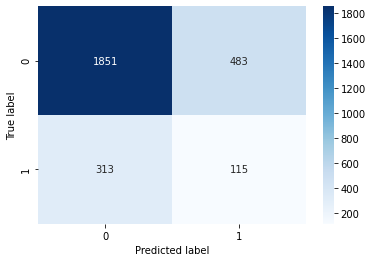

In [ ]:
confusion_matrix_sur = sk.metrics.confusion_matrix(df_test['AGE_GRP_4'], df_test['tech_use_pred1'])
sns.heatmap(confusion_matrix_sur, annot=True,cmap='Blues', fmt='g')
plt.xlabel('Predicted label')
plt.ylabel('True label')

<font color='orange'>Interestingly enough, there is a very low correlation for this age group. However, there are a lot more predicted 0 and true 0 than in the false positives/negatives or true positive sector. Now, let us check the youngest age group:

In [ ]:
#let's first predict values in the testing dataset
df_test['tech_use_prob2'] = results_sur_one.predict(df_test).round(2)

df_test['tech_use_pred2'] = (df_test['tech_use_prob2']>0.2).astype(int) # 0.25 is the threshold of tech use

df_test.head(5)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


,PUMFID,PROVINCE,LUC_RST,ABOSTAT,G_EDUC,HSDSIZEC,GENDER,HCOMP,LAN_Q01,EMP,DGI_Q05,BPR_Q16,AC_160A,AC_170A,AC_170B,AC_170C,AC_170E,AC_170F,AC_170G,AC_170H,AC_180A,AC_190A,AC_190B,AC_190C,AC_190D,AC_G190F,AC_G190I,AC_190J,AC_190K,AC_190L,AC_200A,AC_200B,AC_200C,AC_200D,AC_200E,AC_200F,AC_200G,AC_200H,UI_210A,UI_220A,...,WRPM971,WRPM972,WRPM973,WRPM974,WRPM975,WRPM976,WRPM977,WRPM978,WRPM979,WRPM980,WRPM981,WRPM982,WRPM983,WRPM984,WRPM985,WRPM986,WRPM987,WRPM988,WRPM989,WRPM990,WRPM991,WRPM992,WRPM993,WRPM994,WRPM995,WRPM996,WRPM997,WRPM998,WRPM999,WRPM1000,AGE_GRP_1,AGE_GRP_2,AGE_GRP_3,AGE_GRP_4,AGE_GRP_5,AGE_GRP_6,tech_use_prob1,tech_use_pred1,tech_use_prob2,tech_use_pred2
1450,101450.0,10.0,2.0,3.0,1.0,3.0,1.0,1.0,1.0,2.0,9.0,2.0,1.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,1.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,3.0,1.0,1.0,1.0,1.0,1.0,1.0,3.0,1.0,1.0,...,2742.43085,3012.81102,0.00000,2645.30961,1014.35420,0.00000,2407.46220,0.0,0.00000,790.20983,0.00000,726.37488,0.00000,0.00000,996.82426,1862.22579,2179.00810,1100.04366,1144.65621,0.00000,2656.86354,1106.45397,0.00000,0.00000,0.00000,0.00000,951.32955,0.00000,0.00000,0.00000,0,1,0,0,0,0,0.20,0,0.04,0
12907,112907.0,10.0,2.0,3.0,9.0,2.0,1.0,2.0,1.0,2.0,3.0,9.0,1.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,1.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,1.0,3.0,3.0,3.0,1.0,1.0,1.0,3.0,1.0,1.0,...,478.19108,0.00000,1298.23828,793.05073,0.00000,477.49114,0.00000,0.0,506.74301,491.11041,0.00000,1394.99249,0.00000,468.98458,1175.71291,465.90366,0.00000,380.92459,454.27181,1127.80395,1778.26549,514.65805,0.00000,3043.82909,0.00000,1375.68663,0.00000,0.00000,979.66375,529.43714,0,0,0,0,1,0,0.20,0,0.02,0
11467,111467.0,24.0,1.0,3.0,9.0,2.0,1.0,2.0,3.0,2.0,3.0,9.0,1.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,1.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,3.0,3.0,1.0,3.0,3.0,1.0,3.0,3.0,2.0,3.0,...,4030.49685,0.00000,10295.86555,0.00000,4168.86275,8626.04747,5965.67126,0.0,0.00000,0.00000,0.00000,5363.47219,0.00000,4925.19787,4946.84647,4691.19251,4597.90043,4882.68801,0.00000,8096.05774,5226.67133,4687.10829,9658.10516,9053.37126,7622.97861,0.00000,4077.60818,0.00000,7118.69852,0.00000,0,1,0,0,0,0,0.10,0,0.02,0
12318,112318.0,35.0,2.0,3.0,2.0,1.0,2.0,3.0,3.0,9.0,3.0,1.0,1.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,3.0,1.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,1.0,3.0,3.0,3.0,3.0,3.0,3.0,1.0,...,2506.52328,6862.04078,2213.95993,7326.25631,0.00000,4903.24073,2024.72472,0.0,2531.09039,2194.33442,0.00000,0.00000,0.00000,1805.90642,0.00000,4568.09991,2226.06607,0.00000,0.00000,2222.82935,4753.59837,4943.29308,2586.17083,8993.93501,0.00000,2131.59655,4898.33769,2511.66680,2060.71229,8756.49652,0,0,0,0,0,1,0.16,0,0.02,0
12191,112191.0,13.0,2.0,3.0,1.0,4.0,1.0,1.0,1.0,1.0,3.0,2.0,1.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,1.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,1.0,3.0,3.0,3.0,3.0,1.0,3.0,3.0,1.0,1.0,...,0.00000,0.00000,2770.49453,0.00000,0.00000,1458.91061,1851.80917,0.0,0.00000,0.00000,1596.53009,1108.73037,1633.92129,1204.94350,978.56360,936.59474,0.00000,3081.30233,2237.27582,1882.40942,2814.13709,1875.80355,1228.01003,0.00000,2571.67815,1284.14900,0.00000,1505.45923,0.00000,0.00000,0,0,1,0,0,0,0.21,1,0.06,0


<font color='orange'>Here is the sum of the youngest age group with a probability above 0.25, and I got 71.

In [ ]:
sample = df_test.tech_use_prob2 > 0.25
sample.sum()

71

<font color='orange'>71 is a lot higher than 29 for the number above 0.25. Now, I will run the confusion matrix on the youngest age group (15-24 yr old).

Text(33.0, 0.5, 'True label')

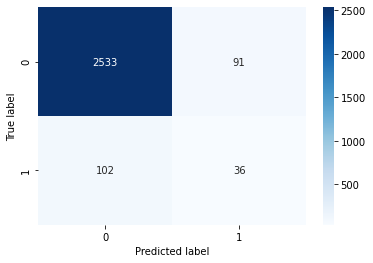

In [ ]:
confusion_matrix_sur_one = sk.metrics.confusion_matrix(df_test['AGE_GRP_1'], df_test['tech_use_pred2'])
sns.heatmap(confusion_matrix_sur_one, annot=True,cmap='Blues', fmt='g')
plt.xlabel('Predicted label')
plt.ylabel('True label')

<font color='orange'>This group has over 2500 in the predicted false and true false group, showing a stronger model than the older generation. Although the sample size is smaller, the predictability for internet use is greater.

<font color='orange'>Now, let's test the accuracy, precision and recall.

In [ ]:
print("For the mean age group (45-54):")
print('Accuracy: {:.2f}'.format(sk.metrics.accuracy_score(df_test['AGE_GRP_4'], df_test['tech_use_pred1'])))
print('Precision: {:.2f}'.format(sk.metrics.precision_score(df_test['AGE_GRP_4'], df_test['tech_use_pred1'])))
print('Recall: {:.2f}'.format(sk.metrics.recall_score(df_test['AGE_GRP_4'], df_test['tech_use_pred1'])))

For the mean age group (45-54):
Accuracy: 0.71
Precision: 0.19
Recall: 0.27


In [ ]:
print("For the youngest age group (15-24):")
print('Accuracy: {:.2f}'.format(sk.metrics.accuracy_score(df_test['AGE_GRP_1'], df_test['tech_use_pred2'])))
print('Precision: {:.2f}'.format(sk.metrics.precision_score(df_test['AGE_GRP_1'], df_test['tech_use_pred2'])))
print('Recall: {:.2f}'.format(sk.metrics.recall_score(df_test['AGE_GRP_1'], df_test['tech_use_pred2'])))

For the youngest age group (15-24):
Accuracy: 0.93
Precision: 0.28
Recall: 0.26


<font color='orange'>Wow, interestingly (although shown in the confusion matrix) the accuracy was a lot higher for the younger age group, implying that it is easier to predict what they are using on their smartphones. However, the precision and recall are very low for both, implying that it is labelling them incorrectly.

<font color='orange'>Finally, I will run a decision tree on the different parameters in order to attempt to hyper-tune the model so that it performs even better.

#### <font color='lightblue'>3. Data wrangling and preprocessing Pt3: </font>



<font color='orange'>First, I created a dataframe only containing the questions and checked it.

In [ ]:
#I created a dataframe with only the relevant questions.
df_tech_questions = df_tech[['SM_300A','SM_300B','SM_300C','SM_300D','SM_300E','SM_300F','SM_300G','SM_300H','SM_300I','SM_300J','SM_300K']]

In [ ]:
df_tech_questions.head()

,SM_300A,SM_300B,SM_300C,SM_300D,SM_300E,SM_300F,SM_300G,SM_300H,SM_300I,SM_300J,SM_300K
0,1.0,3.0,1.0,3.0,3.0,1.0,1.0,1.0,3.0,1.0,3.0
1,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0,6.0
2,1.0,3.0,3.0,3.0,3.0,3.0,1.0,3.0,1.0,3.0,3.0
3,3.0,3.0,3.0,3.0,3.0,3.0,1.0,1.0,3.0,3.0,3.0
4,3.0,3.0,3.0,1.0,1.0,3.0,3.0,3.0,3.0,3.0,3.0


<font color='orange'>Then, I split the data set into the training and testing  sets for the decision tree.

In [ ]:
#split data into predictors (X) and target (y)
X = df_tech_questions
y = df_tech['AGE_GRP']

#split these data into training and testing datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

In [ ]:
X_hyper_train, X_hyper_val, y_hyper_train, y_hyper_val = train_test_split(X_train, y_train, test_size=0.20)

In [ ]:
def fit_decision_tree(maxDep):

  #1. build the algorithm
  classifier = DecisionTreeClassifier(max_depth=maxDep)

  #2. Fit the algorithm
  classifier_res_one = classifier.fit(X_hyper_train, y_hyper_train)

  #3. Make predictions
  y_pred = classifier.predict(X_hyper_val)

  #4. Meausure the accuracy
  accuracy_measured = sk.metrics.accuracy_score(y_hyper_val, y_pred)

  return accuracy_measured

In [ ]:
classifier = DecisionTreeClassifier()
classifier_res_one = classifier.fit(X_hyper_train, y_hyper_train)
print(classifier_res_one)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')


<font color='orange'>Finally, I built the decision tree with each of the age groups labelled.

In [ ]:
#build the figure
viz = dtreeviz(classifier_res_one, X_train, y_train,
                target_name="AGE_GRP",
                feature_names=X_train.columns.to_list(),
                class_names={0:'AGE_GRP_1',1:'AGE_GRP_2',2:'AGE_GRP_3',3:'AGE_GRP_4', 4:'AGE_GRP_5', 5:'AGE_GRP_6'},
                scale=1.0)

#take a look
viz

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


## <font color='lightblue'>5. Interpret your model</font>

**Q5**: Interpret your model results. E.g., what features contributed to your predictions, if possible, can you determine the sign and magnitude of the effect (Marks: 2).

 <font color='orange'>Despite choosing a narrow set of questions (smartphone internet usage), the decision tree and logistic regression models show a clear difference between the age groups. At the top of the decision tree, you can see a clear split in the answers for SM_300E (using Spotify or Apple Music streaming services) and SM_300I (researching information on government programs and services via smartphone). This leads to clear differences within the decision tree on which age group is most likely to have engaged in a given internet activity on their smartphone.

 Given the categorical nature, it is difficult to determine a sign and magnitude, but overall, there generally seems to be more AGE_GRP_2  results than AGE_GRP_6, implying that younger people use a lot more of these applications on their smartphones more. Yet, AGE_GRP_4 also has quite a few results, showing that 45-54 year olds also use various smart phone applications for browsing the internet a lot.

## <font color='lightblue'>6. Answer your question</font>

**Q6:** Use your analysis above to answer your question of interest. Did you achieve your desired outcome, and what might the next steps be? Remember to write as though you are writing to team mates working on the same/similar problem. (Marks: 3)


Note: It is ok if your analysis doesn't provide a strong answer, you can point out where it failed. If anything you can cross the approach you took off the list of possible ways to tackle your question. I.e., you still made progress!

 <font color='orange'>Overall, I did find that you can predict age from given internet usage activities, but at times the correlation is much weaker based on the activity. Younger people are more likely to use smartphones for streaming services and selling products or services, while older people are more likely to use them for searching for employment or not at all. Some activities are completed by more than one age group, making it more difficult to pinpoint one that uses a given application or internet activity. 

 <font color='orange'> Specifically, in regards to my question, "How does Canadian Internet usage relate to age?", I was able to run a decision tree on one multiple choice question related to smart phone use. This model was able to successfully predict when older people were more likely to use a smartphone as compared to other tasks more suited to younger people. The older people (in the mean age group) were more likely to research information on government programs and sell programs or services (suggesting work, the generation of income, or general concern with politics and government). The younger people, in age groups one and two were much more likely to use smart phones for music streaming services such as Spotify or Apple Music. The oldest age group, 65+, despite having the highest number of respondents, barely had any predicted use of a smartphone using the model, showing that the model is running fairly accurately.

 I was able to achieve my desired outcome with my ML model, considering hardware/software limitations on run time as well as only having just over a month's worth of time working with and understanding the data set.


 
  <font color='cyan'>The next steps would be to clean up the data even more and test on other questions in the data set to create an even stronger model based on a broader range of activities on the internet. It would also be nice to incorporate the weighting of the respondents to see more broadly how many people within a given age range one given respondent may represent in Canada.

   <font color='magenta'>One setback is definitely the amount of resources allocated to this project within Colab when working on large datasets; it took a few minutes to run the decision tree with only the subset of 11 questions considered; it would definitely take a lot longer to run it with even just one more multiple choice question. It also becomes a lot harder to sort through the output of the decision tree. It might be nice to find a better model or a better, more efficient way to process and analyze the results. This approach was not the worst; it correctly analyzes the categorical data presented, but takes a lot of sorting and understanding the dataset.